In [6]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

In [7]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    unflat_image_tensor = image_tensor.detach().cpu().view(-1, *size)
    grid_image_tensor = make_grid(unflat_image_tensor[:num_images], nrow=5)
    plt.imshow(grid_image_tensor.permute(1, 2, 0).squeeze())
    plt.show()

In [14]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super().__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
        
    def forward(self, noise):
        return self.gen(noise)

In [15]:
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )

class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super().__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )
        
    def forward(self, image):
        return self.disc(image)

In [20]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

torch.manual_seed(0)
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

gen = Generator(z_dim).cuda()
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().cuda()
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

cur_step = 0
mean_discriminator_loss = 0
mean_generator_loss = 0

Epoch 1, Step 500, Gen Loss 1.387240678191185, Disc Loss 0.41940738564729674


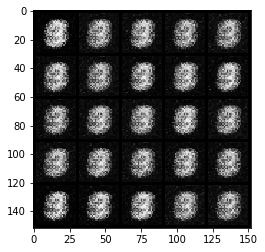

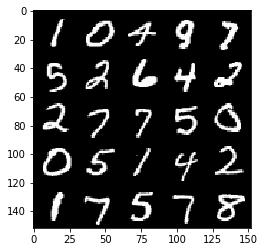

Epoch 2, Step 1000, Gen Loss 1.6633577864170088, Disc Loss 0.30257412946224216


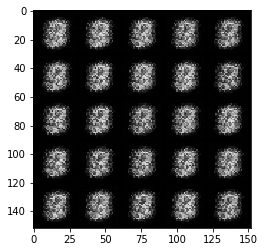

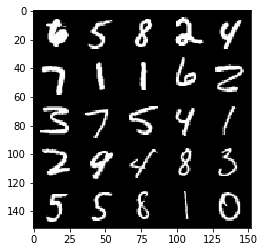

Epoch 3, Step 1500, Gen Loss 1.9572221393585219, Disc Loss 0.17553308463096617


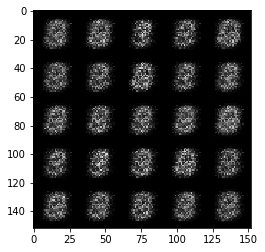

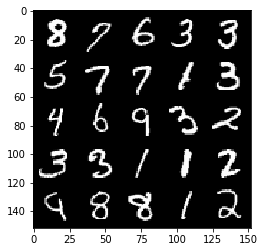

Epoch 4, Step 2000, Gen Loss 1.7603795669078837, Disc Loss 0.19767437821626654


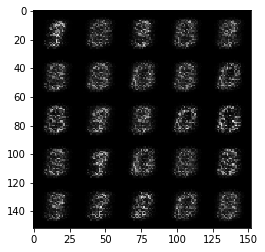

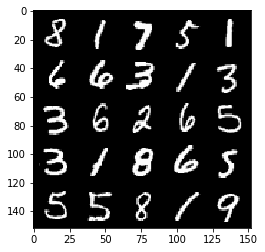

Epoch 5, Step 2500, Gen Loss 1.7272611644268026, Disc Loss 0.19564455571770678


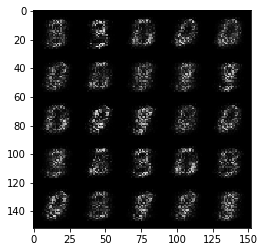

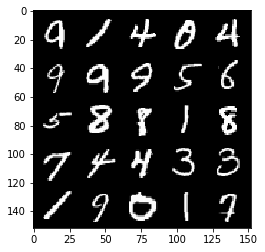

Epoch 6, Step 3000, Gen Loss 2.00506251835823, Disc Loss 0.15213749112188799


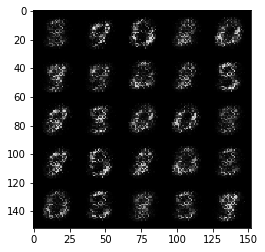

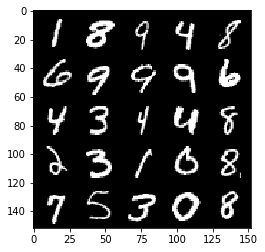

Epoch 7, Step 3500, Gen Loss 2.368045132637024, Disc Loss 0.12879845938086504


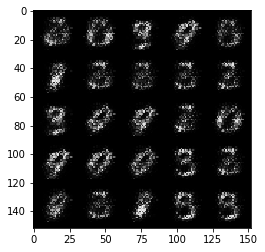

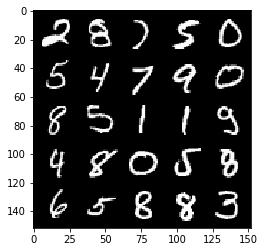

Epoch 8, Step 4000, Gen Loss 2.813383372306823, Disc Loss 0.10836775274574745


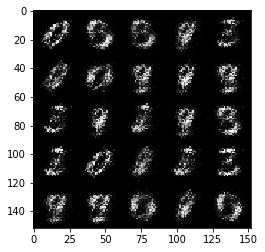

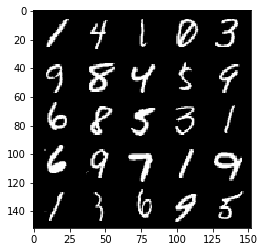

Epoch 9, Step 4500, Gen Loss 3.0602429971694978, Disc Loss 0.10272878637909888


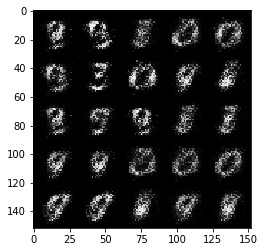

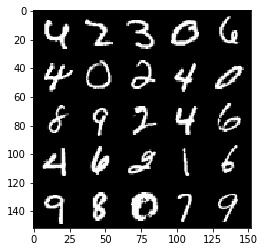

Epoch 10, Step 5000, Gen Loss 3.376949703216552, Disc Loss 0.08784379179775724


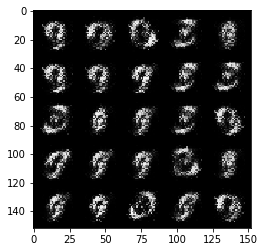

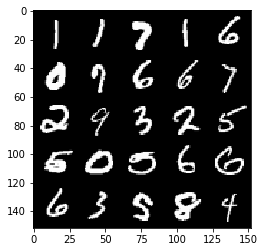

Epoch 11, Step 5500, Gen Loss 3.4100452809333817, Disc Loss 0.0907150574550033


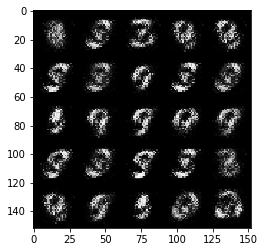

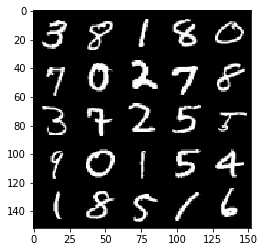

Epoch 12, Step 6000, Gen Loss 3.49292566013336, Disc Loss 0.0836370453163982


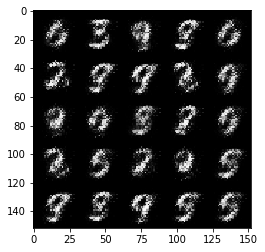

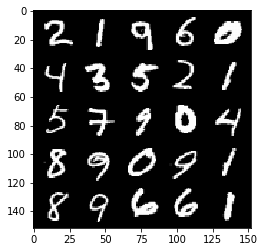

Epoch 13, Step 6500, Gen Loss 3.7221354146003742, Disc Loss 0.06281390226632368


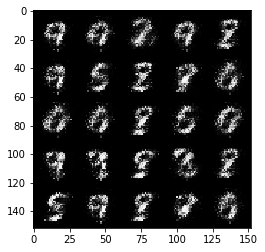

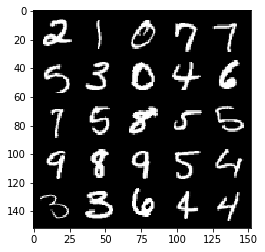

Epoch 14, Step 7000, Gen Loss 3.777347680091859, Disc Loss 0.05692866871505978


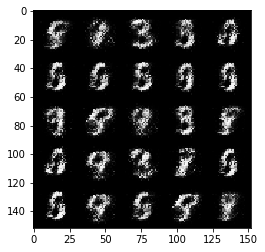

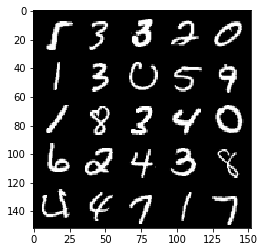

Epoch 15, Step 7500, Gen Loss 4.0664495859146115, Disc Loss 0.05768281747400757


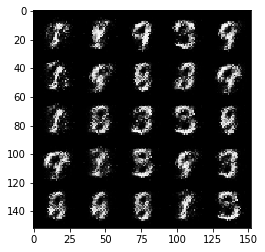

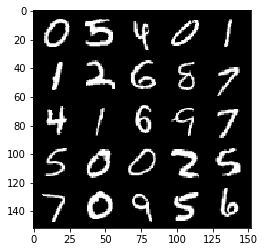

Epoch 17, Step 8000, Gen Loss 3.9708996028900176, Disc Loss 0.05981826535239819


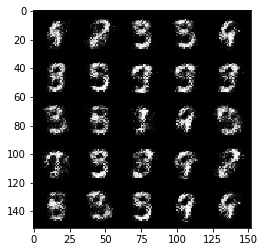

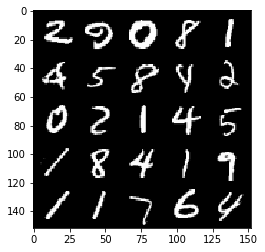

Epoch 18, Step 8500, Gen Loss 3.9233539662361165, Disc Loss 0.0614988545700908


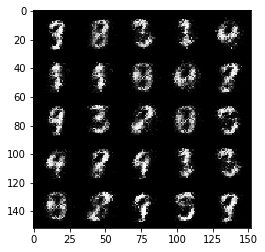

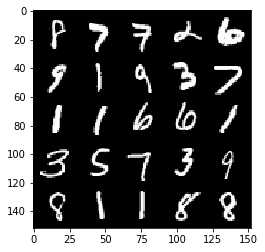

Epoch 19, Step 9000, Gen Loss 3.9126872549057032, Disc Loss 0.07191788328438999


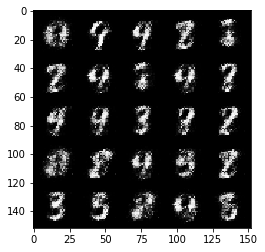

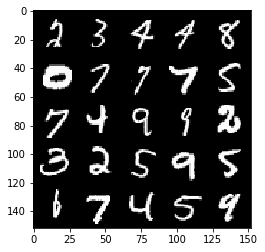

Epoch 20, Step 9500, Gen Loss 3.890450584888456, Disc Loss 0.06836931826919321


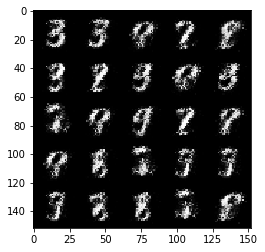

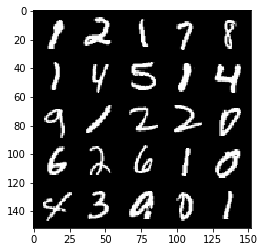

Epoch 21, Step 10000, Gen Loss 4.039990184307096, Disc Loss 0.057787261858582434


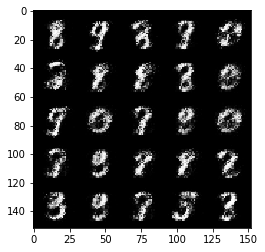

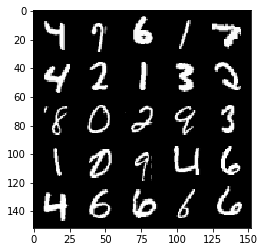

Epoch 22, Step 10500, Gen Loss 3.901107868194581, Disc Loss 0.0607689415030181


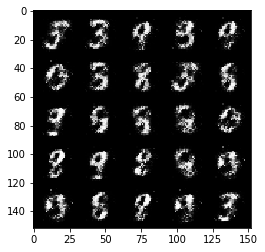

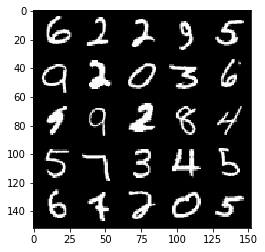

Epoch 23, Step 11000, Gen Loss 3.941776983261108, Disc Loss 0.07261089645326144


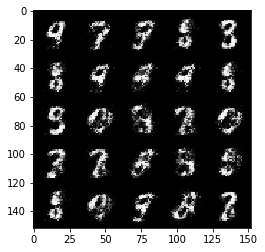

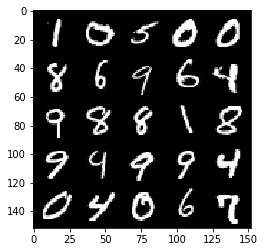

Epoch 24, Step 11500, Gen Loss 3.89725440788269, Disc Loss 0.08223602499067786


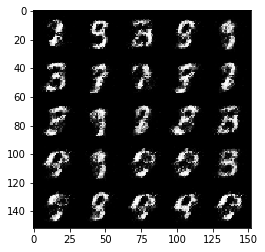

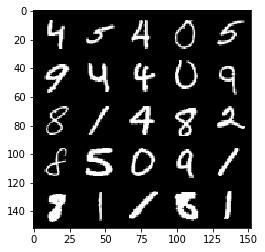

Epoch 25, Step 12000, Gen Loss 3.901141137599946, Disc Loss 0.08197039166092882


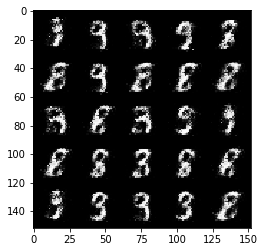

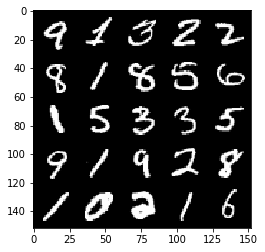

Epoch 26, Step 12500, Gen Loss 3.7799393253326365, Disc Loss 0.08400757186114782


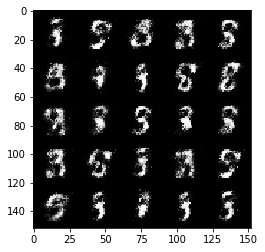

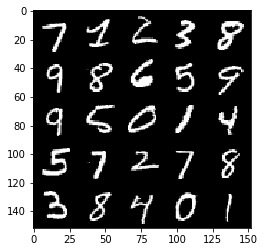

Epoch 27, Step 13000, Gen Loss 3.9210551371574374, Disc Loss 0.07861481058597575


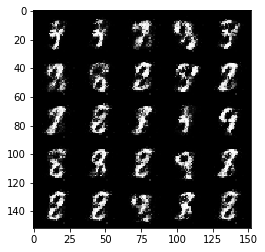

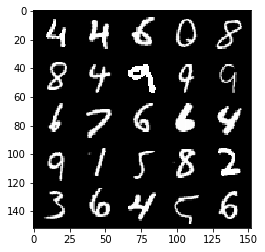

Epoch 28, Step 13500, Gen Loss 3.756991668224334, Disc Loss 0.09682767388224603


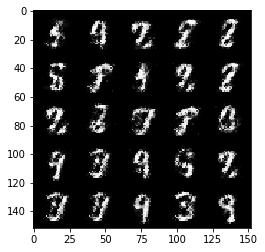

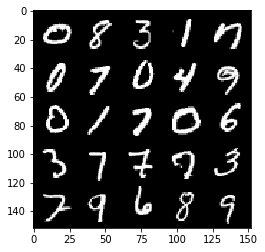

Epoch 29, Step 14000, Gen Loss 3.6819153547286994, Disc Loss 0.11052256179600954


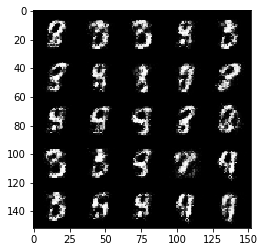

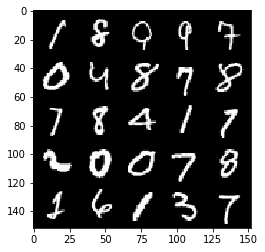

Epoch 30, Step 14500, Gen Loss 3.5440251612663247, Disc Loss 0.10066533952206375


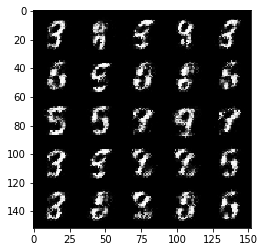

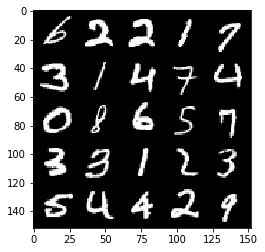

Epoch 31, Step 15000, Gen Loss 3.7227465567588767, Disc Loss 0.10318897118419415


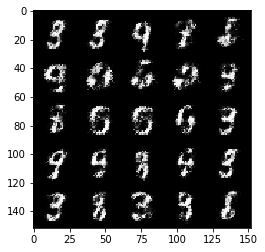

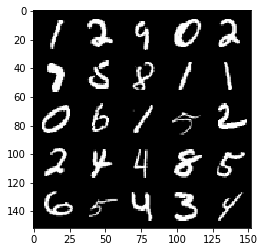

Epoch 33, Step 15500, Gen Loss 3.5807182321548487, Disc Loss 0.12141649132967007


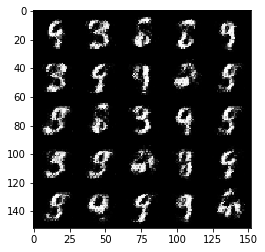

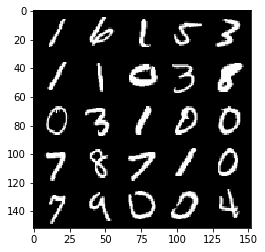

Epoch 34, Step 16000, Gen Loss 3.655548392772679, Disc Loss 0.1176406530141831


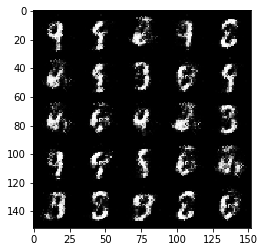

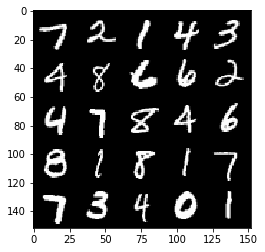

Epoch 35, Step 16500, Gen Loss 3.4943930678367643, Disc Loss 0.12539790967851872


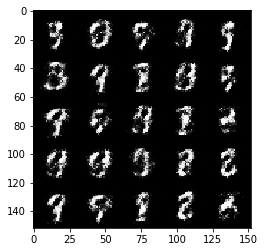

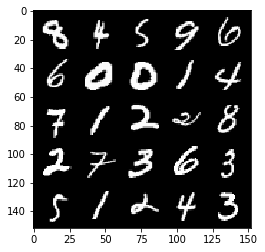

Epoch 36, Step 17000, Gen Loss 3.588575646877286, Disc Loss 0.11249196657538406


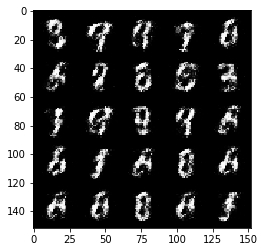

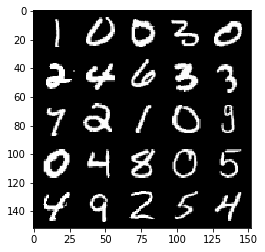

Epoch 37, Step 17500, Gen Loss 3.521382800579069, Disc Loss 0.1278403388410806


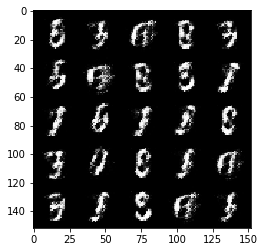

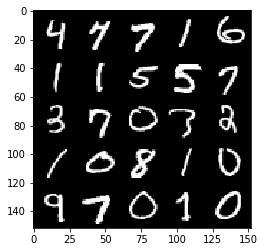

Epoch 38, Step 18000, Gen Loss 3.537950874805449, Disc Loss 0.11742286222428092


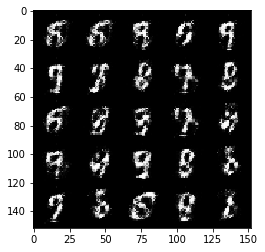

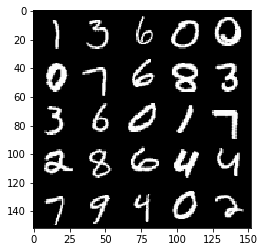

Epoch 39, Step 18500, Gen Loss 3.404426152706147, Disc Loss 0.1409998013973236


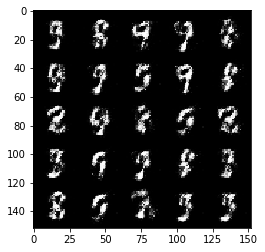

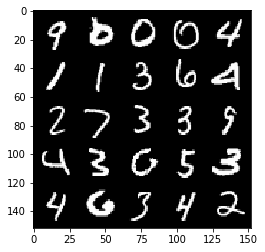

Epoch 40, Step 19000, Gen Loss 3.3236598200798064, Disc Loss 0.14644863674044611


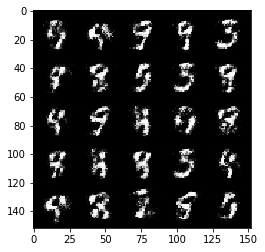

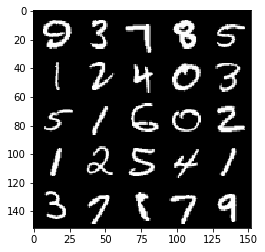

Epoch 41, Step 19500, Gen Loss 3.3023481416702274, Disc Loss 0.14421540065109725


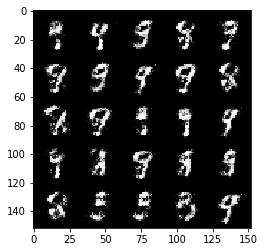

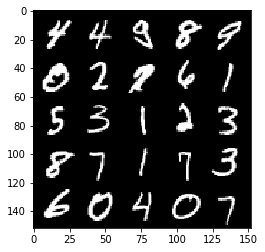

Epoch 42, Step 20000, Gen Loss 3.191219442367553, Disc Loss 0.15361010356247398


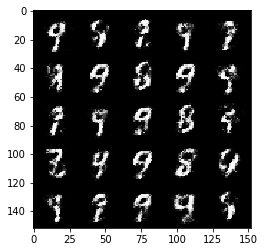

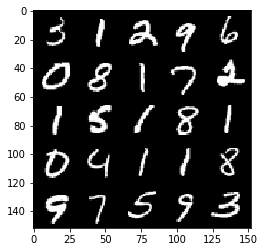

Epoch 43, Step 20500, Gen Loss 3.0244712634086612, Disc Loss 0.16693418098986146


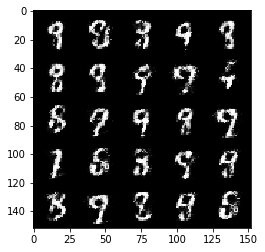

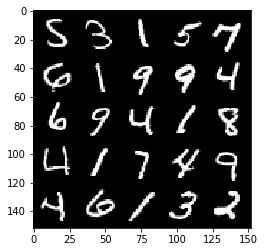

Epoch 44, Step 21000, Gen Loss 3.0647746591567984, Disc Loss 0.16523389823734755


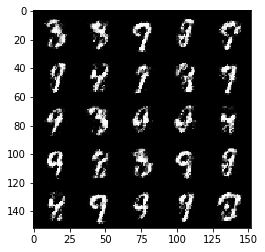

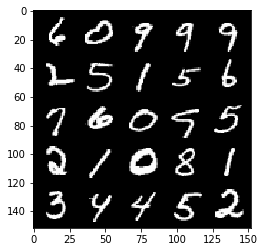

Epoch 45, Step 21500, Gen Loss 3.042047646045685, Disc Loss 0.1820619951933624


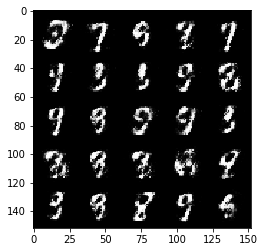

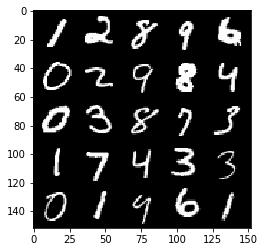

Epoch 46, Step 22000, Gen Loss 3.1128235373497057, Disc Loss 0.16369330267608173


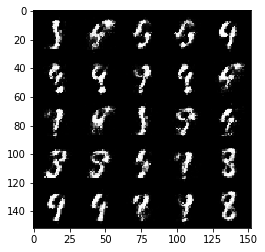

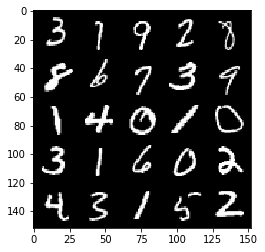

Epoch 47, Step 22500, Gen Loss 3.1390208849906913, Disc Loss 0.17157604016363623


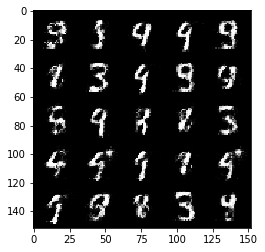

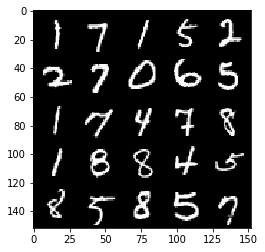

Epoch 49, Step 23000, Gen Loss 2.981490827560425, Disc Loss 0.18468823470175263


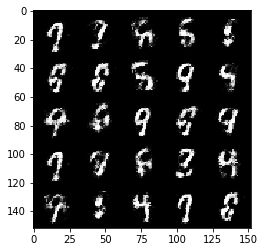

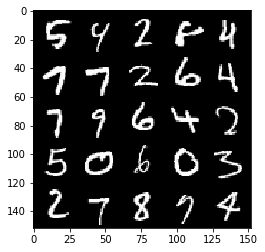

Epoch 50, Step 23500, Gen Loss 2.721835425376891, Disc Loss 0.20925002308189866


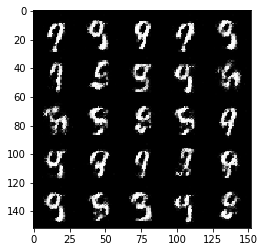

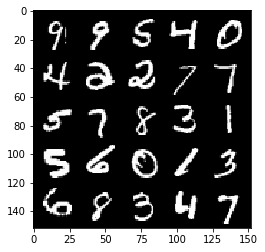

Epoch 51, Step 24000, Gen Loss 2.829131403923035, Disc Loss 0.21358731836080552


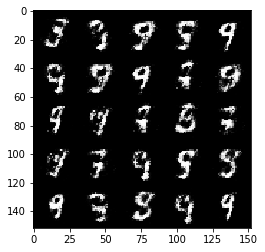

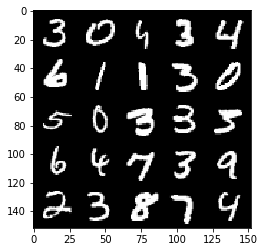

Epoch 52, Step 24500, Gen Loss 2.721745592594145, Disc Loss 0.21488368502259267


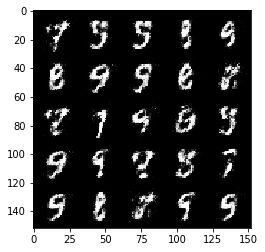

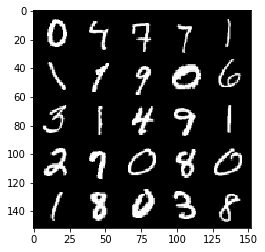

Epoch 53, Step 25000, Gen Loss 2.970069904327391, Disc Loss 0.19056232993304734


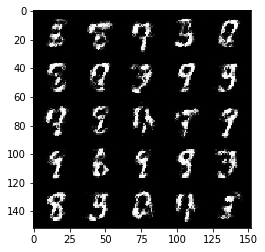

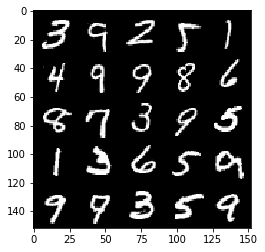

Epoch 54, Step 25500, Gen Loss 3.0050360288619986, Disc Loss 0.18592947220802297


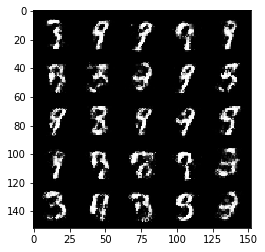

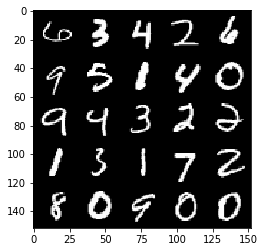

Epoch 55, Step 26000, Gen Loss 2.849082040786741, Disc Loss 0.20689080917835231


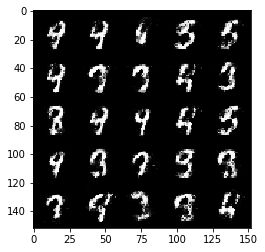

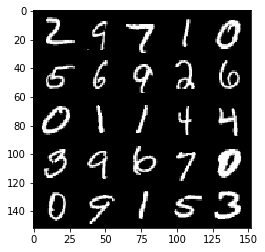

Epoch 56, Step 26500, Gen Loss 2.860244136810304, Disc Loss 0.19373501822352412


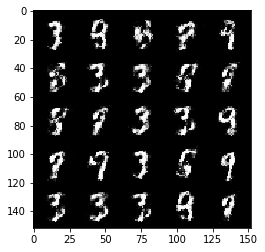

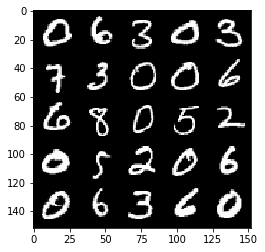

Epoch 57, Step 27000, Gen Loss 2.9293400688171403, Disc Loss 0.19250475594401362


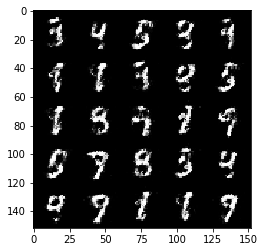

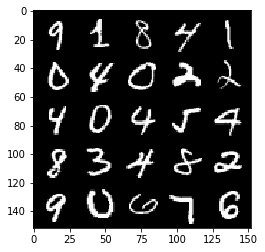

Epoch 58, Step 27500, Gen Loss 3.005249009132384, Disc Loss 0.17804827803373321


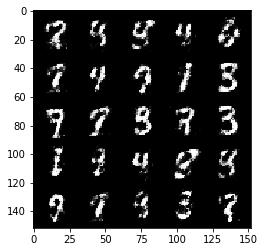

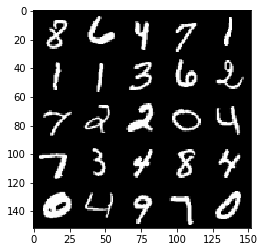

Epoch 59, Step 28000, Gen Loss 2.81815082550049, Disc Loss 0.20237808671593646


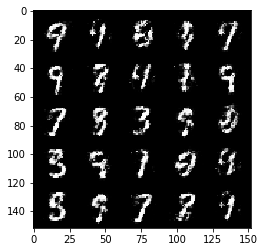

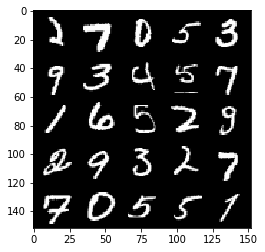

Epoch 60, Step 28500, Gen Loss 2.789449169158934, Disc Loss 0.19635063701868055


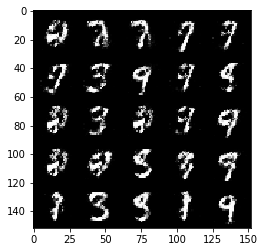

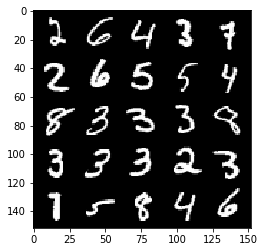

Epoch 61, Step 29000, Gen Loss 2.7476670074462883, Disc Loss 0.19428099673986424


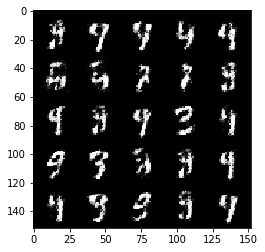

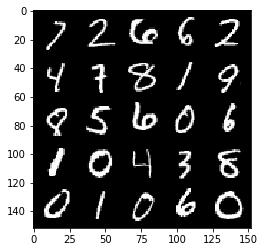

Epoch 62, Step 29500, Gen Loss 2.863589843273166, Disc Loss 0.18734847451746464


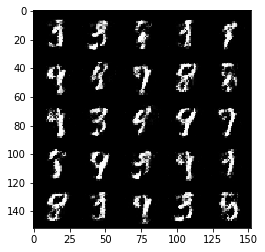

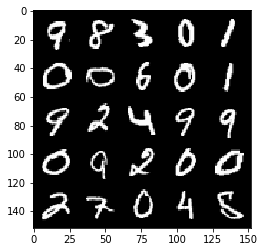

Epoch 63, Step 30000, Gen Loss 2.767429362773893, Disc Loss 0.2097983586788176


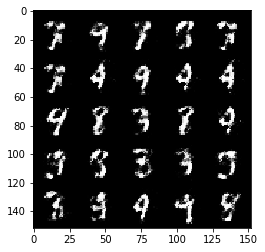

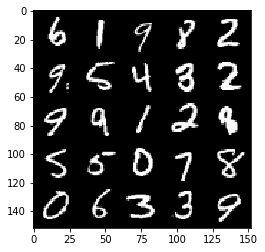

Epoch 65, Step 30500, Gen Loss 2.685247366905212, Disc Loss 0.22128927305340765


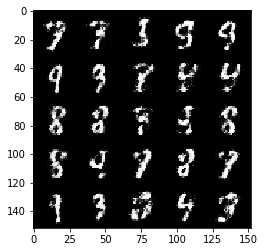

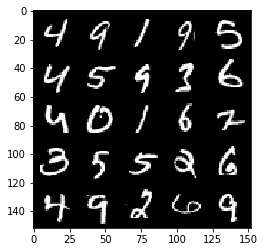

Epoch 66, Step 31000, Gen Loss 2.5947946233749373, Disc Loss 0.23458352831006035


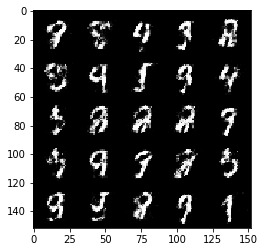

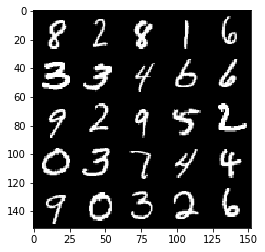

Epoch 67, Step 31500, Gen Loss 2.5702791633605946, Disc Loss 0.24137792912125597


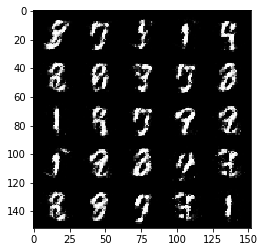

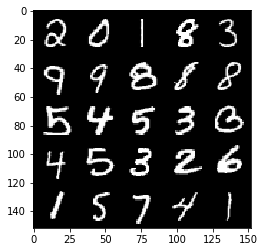

Epoch 68, Step 32000, Gen Loss 2.561190974712372, Disc Loss 0.23187304875254652


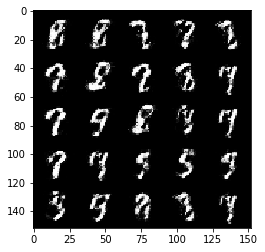

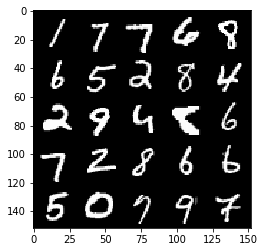

Epoch 69, Step 32500, Gen Loss 2.629124844551084, Disc Loss 0.22703139007091547


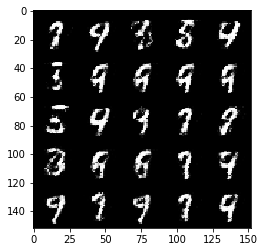

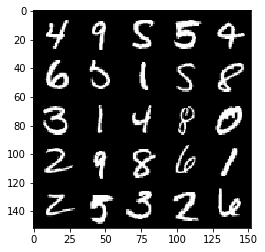

Epoch 70, Step 33000, Gen Loss 2.6002038602829014, Disc Loss 0.22423080882430083


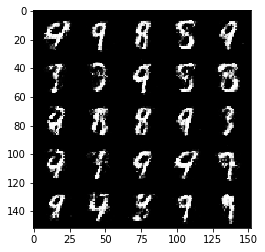

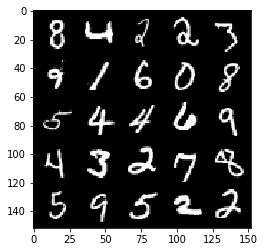

Epoch 71, Step 33500, Gen Loss 2.5671358640193898, Disc Loss 0.23435975816845916


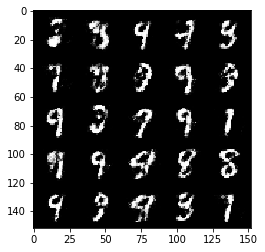

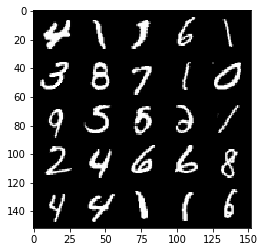

Epoch 72, Step 34000, Gen Loss 2.4051749808788316, Disc Loss 0.2615441520512101


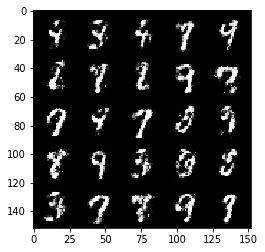

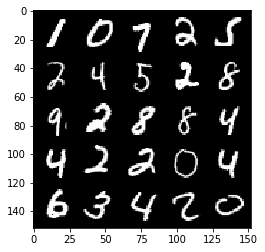

Epoch 73, Step 34500, Gen Loss 2.377809134960174, Disc Loss 0.2583431798815727


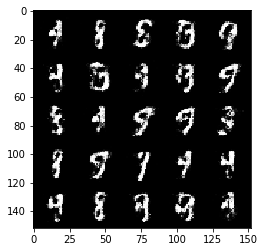

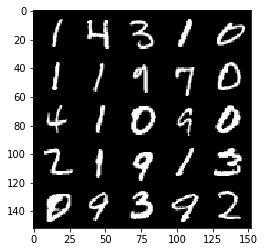

Epoch 74, Step 35000, Gen Loss 2.48358174967766, Disc Loss 0.23601686343550676


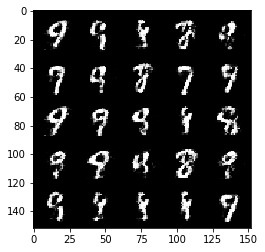

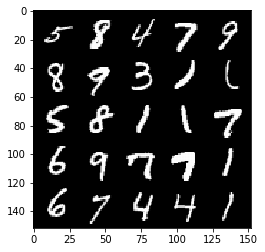

Epoch 75, Step 35500, Gen Loss 2.4290781974792477, Disc Loss 0.2584948500394822


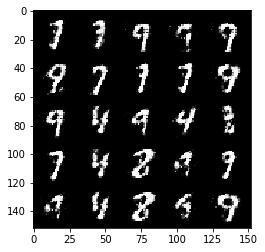

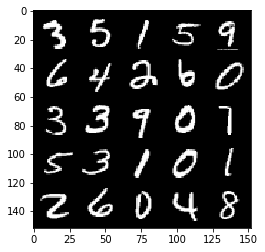

Epoch 76, Step 36000, Gen Loss 2.250989979505538, Disc Loss 0.2694885220825671


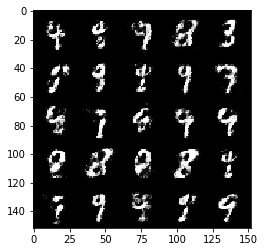

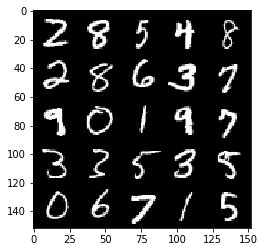

Epoch 77, Step 36500, Gen Loss 2.343454494714736, Disc Loss 0.25822047099471096


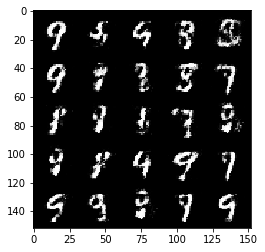

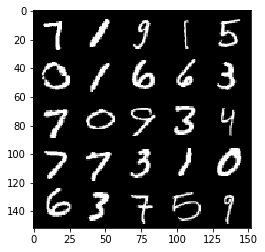

Epoch 78, Step 37000, Gen Loss 2.3770284364223477, Disc Loss 0.26343279668688807


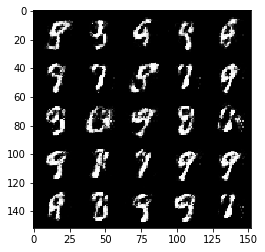

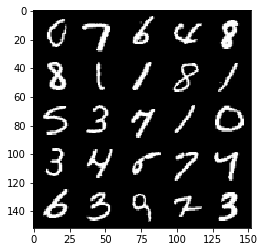

Epoch 79, Step 37500, Gen Loss 2.334727465629577, Disc Loss 0.2687057043612005


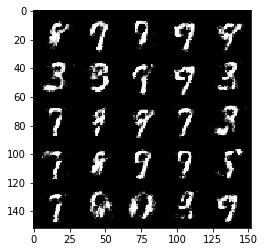

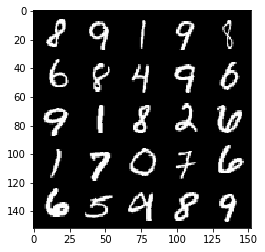

Epoch 81, Step 38000, Gen Loss 2.2734429702758794, Disc Loss 0.2800080503523352


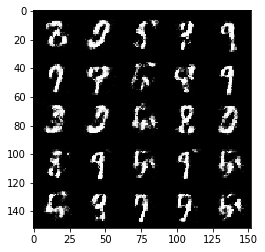

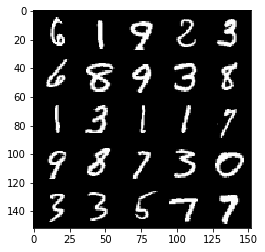

Epoch 82, Step 38500, Gen Loss 2.3010292923450484, Disc Loss 0.2828939449787139


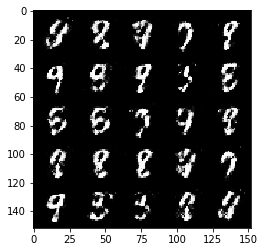

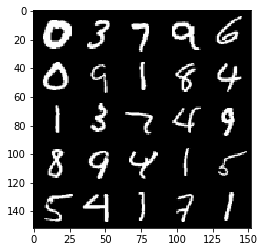

Epoch 83, Step 39000, Gen Loss 2.2227760872840885, Disc Loss 0.2922429321408271


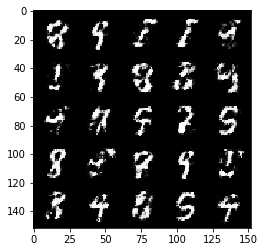

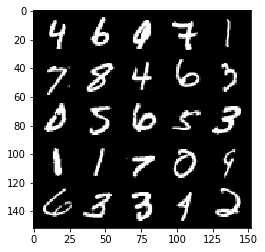

Epoch 84, Step 39500, Gen Loss 2.169911040782928, Disc Loss 0.2897974494397642


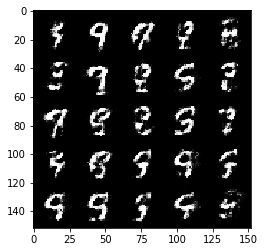

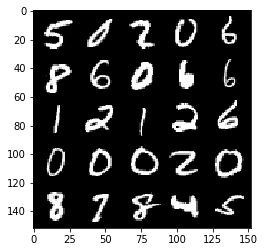

Epoch 85, Step 40000, Gen Loss 2.185963617801667, Disc Loss 0.3033162195384503


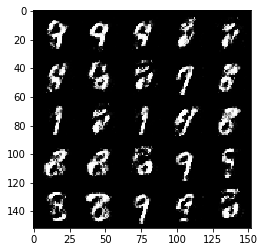

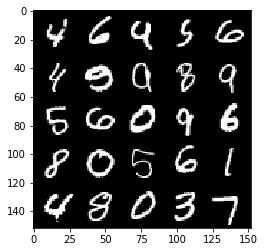

Epoch 86, Step 40500, Gen Loss 2.2083073067665118, Disc Loss 0.29080645200610145


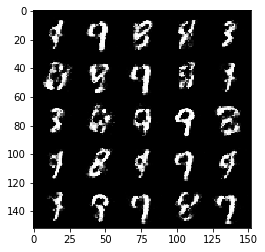

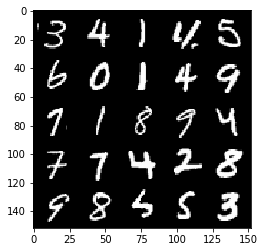

Epoch 87, Step 41000, Gen Loss 2.211066853046417, Disc Loss 0.2906311130523683


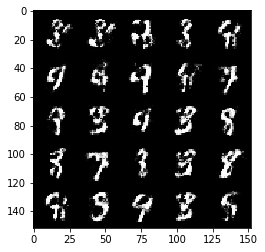

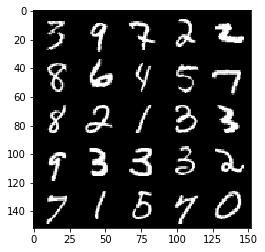

Epoch 88, Step 41500, Gen Loss 2.137172693490985, Disc Loss 0.2997844037413597


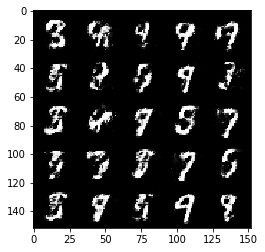

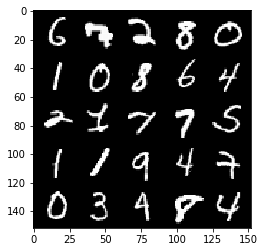

Epoch 89, Step 42000, Gen Loss 2.144640341997148, Disc Loss 0.29977040597796445


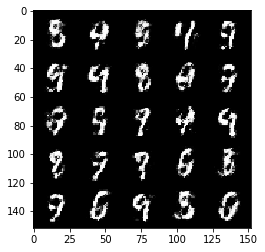

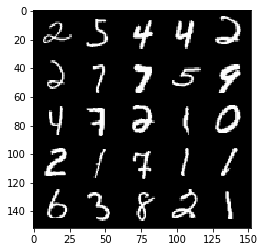

Epoch 90, Step 42500, Gen Loss 2.064377973794937, Disc Loss 0.31957456269860285


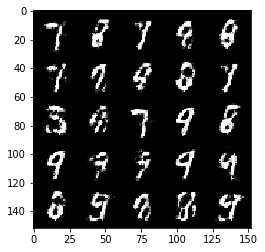

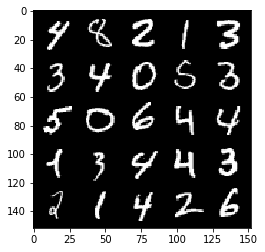

Epoch 91, Step 43000, Gen Loss 2.1184479265213016, Disc Loss 0.3119523923397066


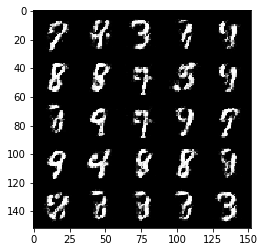

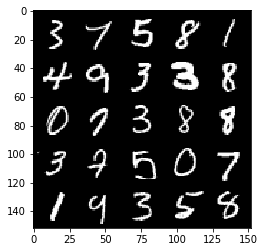

Epoch 92, Step 43500, Gen Loss 2.078156999588013, Disc Loss 0.29844041866064047


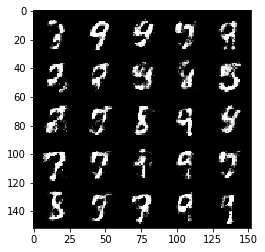

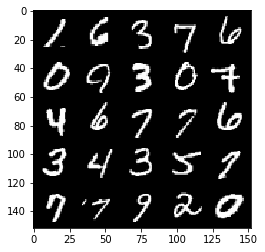

Epoch 93, Step 44000, Gen Loss 2.102480986595154, Disc Loss 0.2979289128184321


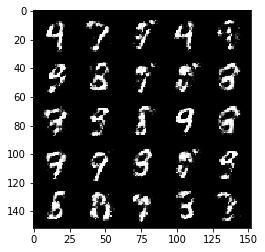

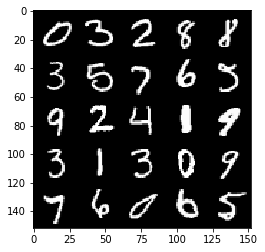

Epoch 94, Step 44500, Gen Loss 2.109227439403537, Disc Loss 0.31264022952318155


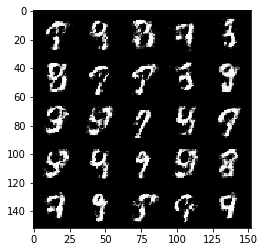

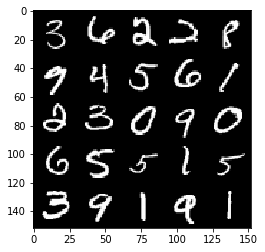

Epoch 95, Step 45000, Gen Loss 2.044248024940492, Disc Loss 0.31297302833199503


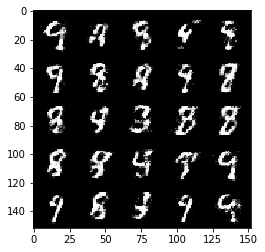

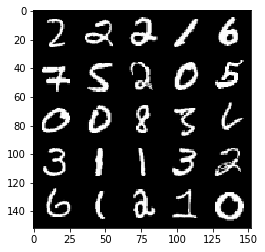

Epoch 97, Step 45500, Gen Loss 1.9548989551067362, Disc Loss 0.33348415103554724


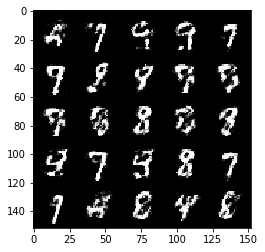

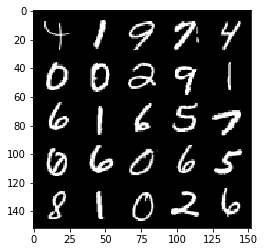

Epoch 98, Step 46000, Gen Loss 1.9674330248832688, Disc Loss 0.3256102122664452


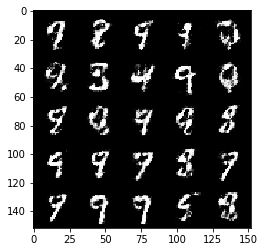

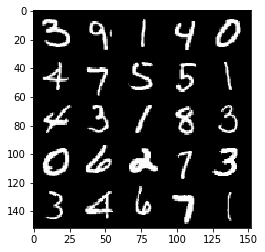

Epoch 99, Step 46500, Gen Loss 2.0158159291744226, Disc Loss 0.3107286343574521


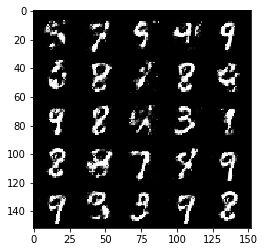

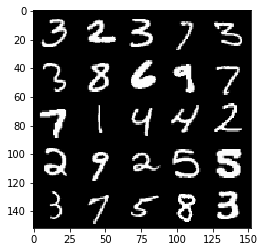

Epoch 100, Step 47000, Gen Loss 2.148107498168943, Disc Loss 0.28653404507040964


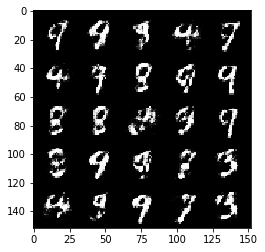

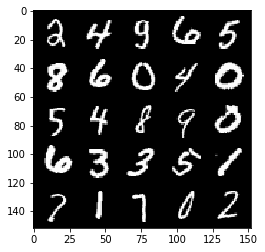

Epoch 101, Step 47500, Gen Loss 2.023251782417298, Disc Loss 0.31513676553964615


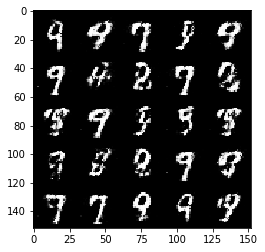

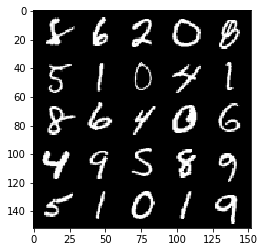

Epoch 102, Step 48000, Gen Loss 2.0763667247295374, Disc Loss 0.29543223080039005


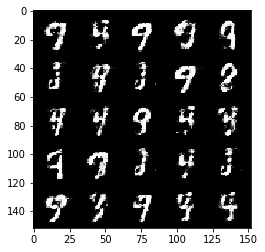

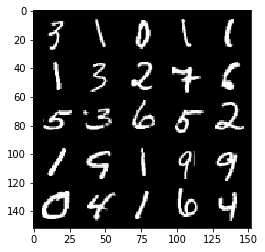

Epoch 103, Step 48500, Gen Loss 2.0967316925525625, Disc Loss 0.29974201285839075


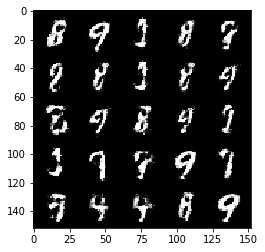

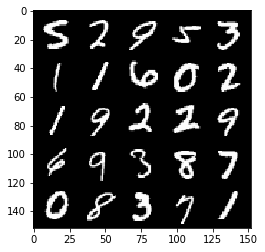

Epoch 104, Step 49000, Gen Loss 2.0424084808826444, Disc Loss 0.30927646493911737


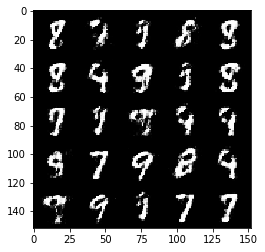

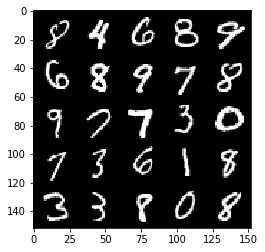

Epoch 105, Step 49500, Gen Loss 2.002410239696501, Disc Loss 0.32053024151921267


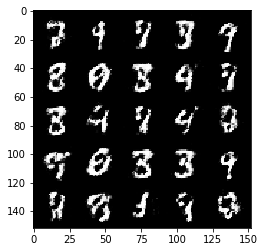

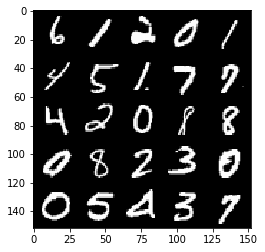

Epoch 106, Step 50000, Gen Loss 1.9426005098819727, Disc Loss 0.3378002026677131


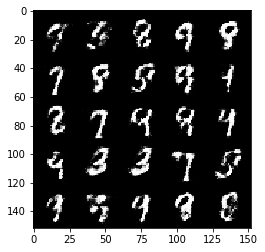

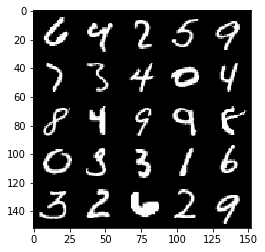

Epoch 107, Step 50500, Gen Loss 1.9359606032371517, Disc Loss 0.3257553248405456


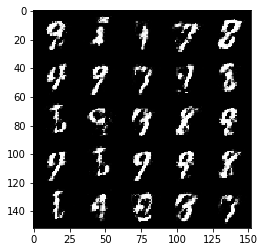

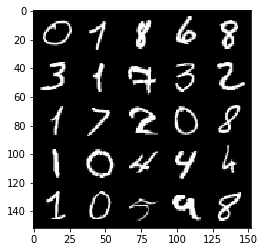

Epoch 108, Step 51000, Gen Loss 1.9678588197231295, Disc Loss 0.33072662463784264


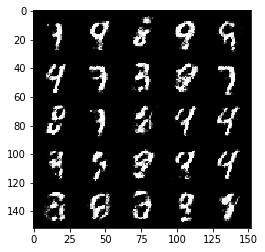

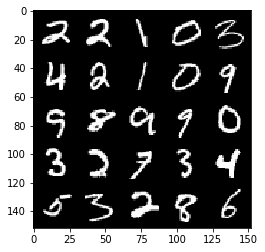

Epoch 109, Step 51500, Gen Loss 1.8500016062259692, Disc Loss 0.3572332436740399


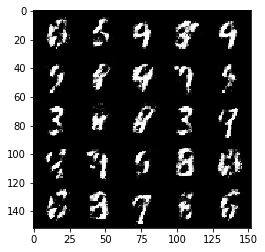

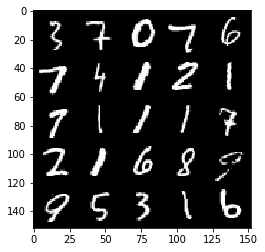

Epoch 110, Step 52000, Gen Loss 1.9500712714195239, Disc Loss 0.32520438945293406


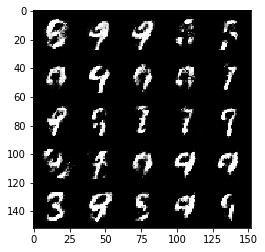

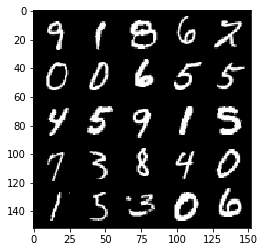

Epoch 111, Step 52500, Gen Loss 1.9792339541912072, Disc Loss 0.31274878048896837


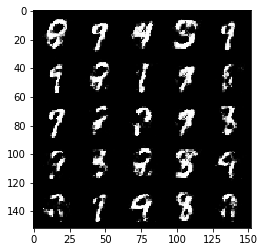

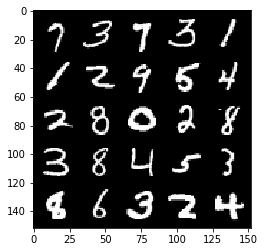

Epoch 113, Step 53000, Gen Loss 1.9157576673030867, Disc Loss 0.35452782782912245


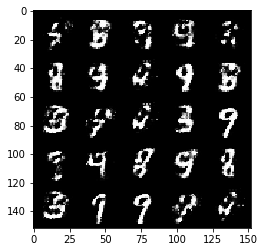

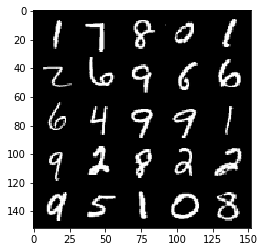

Epoch 114, Step 53500, Gen Loss 1.853336707830428, Disc Loss 0.3464321743547916


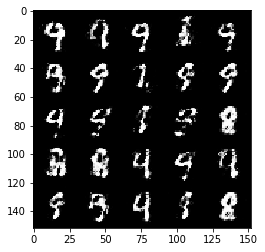

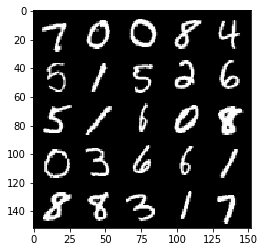

Epoch 115, Step 54000, Gen Loss 1.8414487690925605, Disc Loss 0.3452141554653646


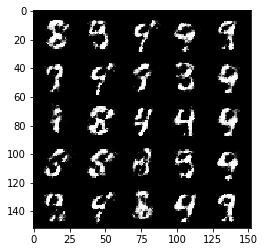

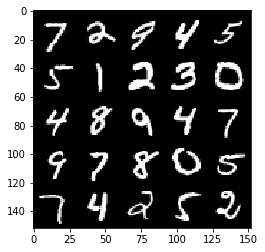

Epoch 116, Step 54500, Gen Loss 1.936955492973327, Disc Loss 0.32315881243348094


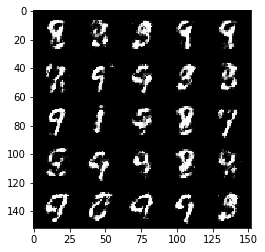

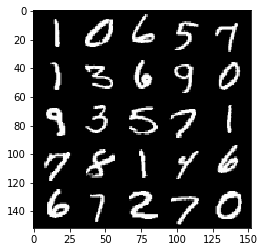

Epoch 117, Step 55000, Gen Loss 1.8673695979118372, Disc Loss 0.35734563145041476


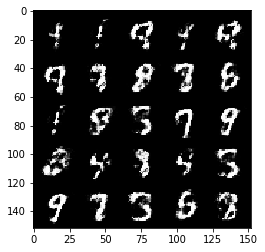

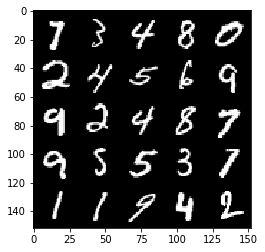

Epoch 118, Step 55500, Gen Loss 1.8670159647464737, Disc Loss 0.3538150331377983


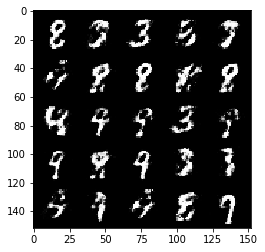

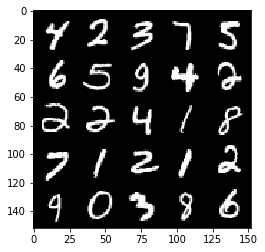

Epoch 119, Step 56000, Gen Loss 1.881648068189621, Disc Loss 0.3348206870555876


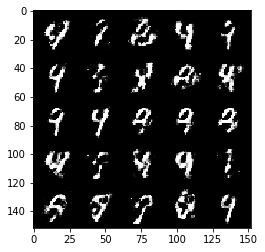

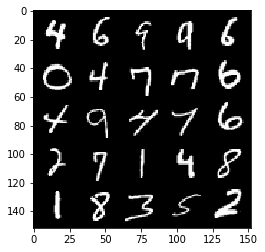

Epoch 120, Step 56500, Gen Loss 1.9626821017265328, Disc Loss 0.3200547825992109


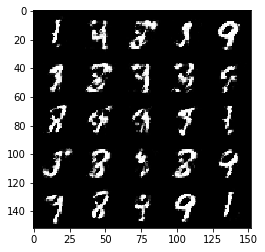

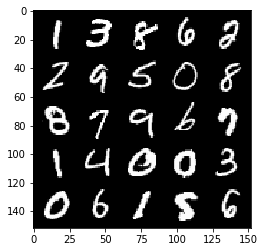

Epoch 121, Step 57000, Gen Loss 1.9044871480464929, Disc Loss 0.33721864414215125


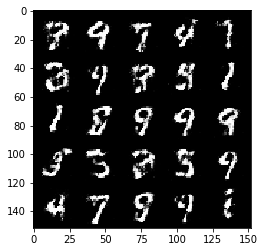

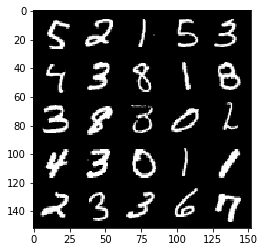

Epoch 122, Step 57500, Gen Loss 1.838075170755386, Disc Loss 0.3562800891995432


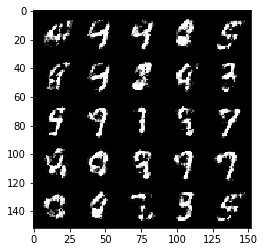

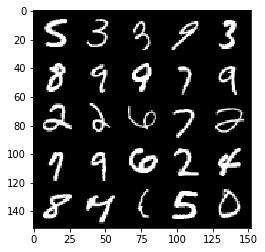

Epoch 123, Step 58000, Gen Loss 1.8145373947620411, Disc Loss 0.3662510584592817


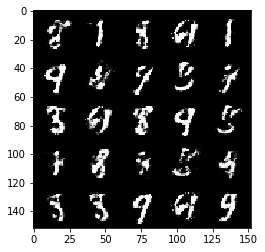

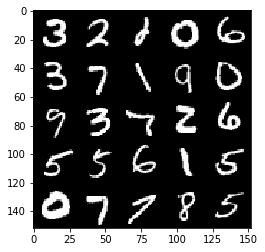

Epoch 124, Step 58500, Gen Loss 1.8181852645874028, Disc Loss 0.3445483652353287


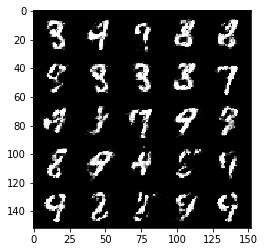

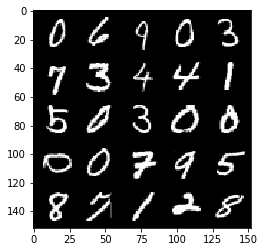

Epoch 125, Step 59000, Gen Loss 1.8516158752441412, Disc Loss 0.3469571894109248


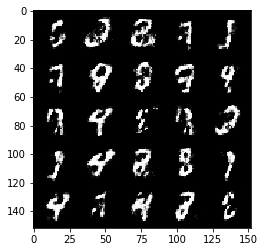

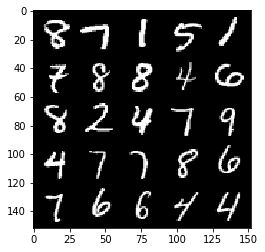

Epoch 126, Step 59500, Gen Loss 1.843756401062011, Disc Loss 0.33949400061368906


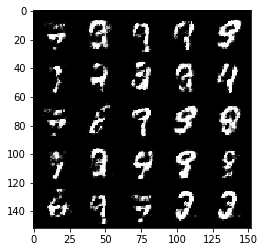

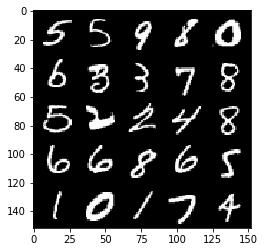

Epoch 127, Step 60000, Gen Loss 1.7626434879302981, Disc Loss 0.3580706087648865


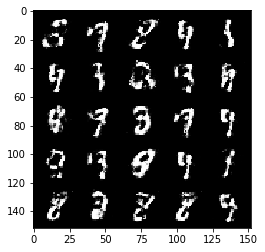

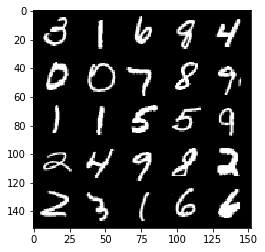

Epoch 128, Step 60500, Gen Loss 1.7919211580753331, Disc Loss 0.35183007520437254


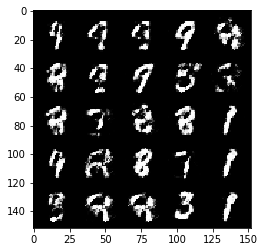

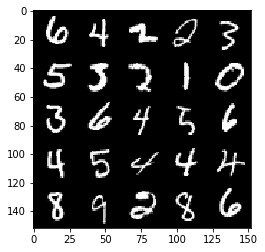

Epoch 130, Step 61000, Gen Loss 1.804278575181962, Disc Loss 0.3489194422960279


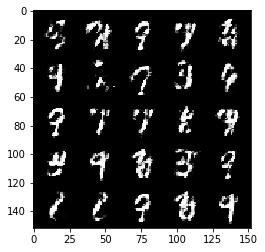

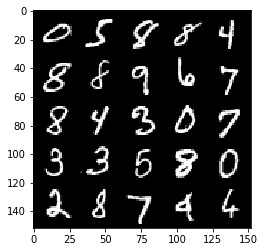

Epoch 131, Step 61500, Gen Loss 1.7185208263397211, Disc Loss 0.37391957473754855


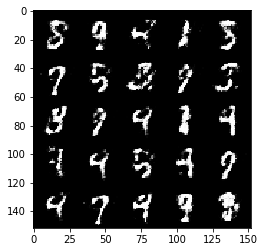

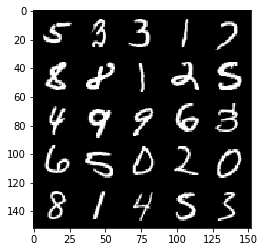

Epoch 132, Step 62000, Gen Loss 1.7202109148502331, Disc Loss 0.3850047531127924


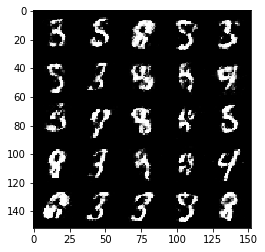

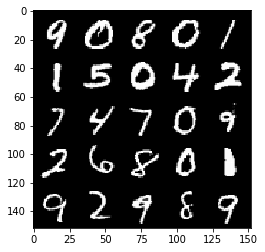

Epoch 133, Step 62500, Gen Loss 1.6666469693183883, Disc Loss 0.3789892053604124


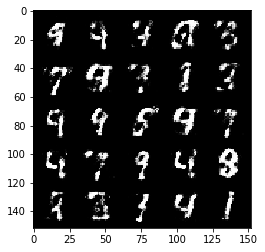

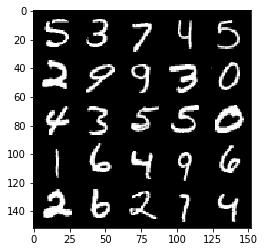

Epoch 134, Step 63000, Gen Loss 1.6564694335460663, Disc Loss 0.37948214799165686


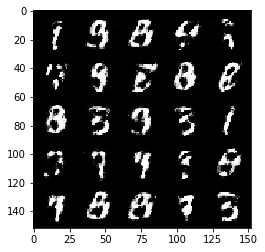

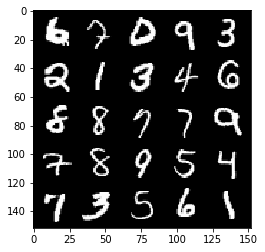

Epoch 135, Step 63500, Gen Loss 1.7215120630264307, Disc Loss 0.3680804126858712


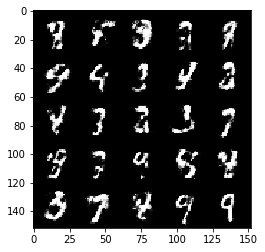

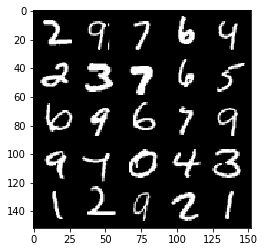

Epoch 136, Step 64000, Gen Loss 1.682413333654404, Disc Loss 0.388588770389557


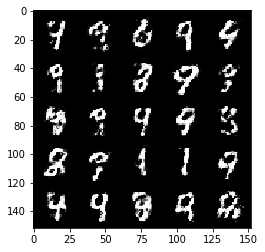

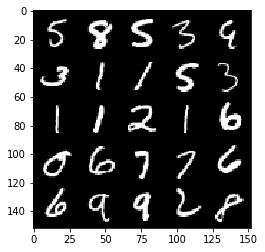

Epoch 137, Step 64500, Gen Loss 1.5919906871318823, Disc Loss 0.41062926697731067


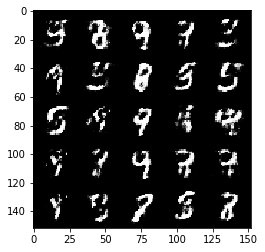

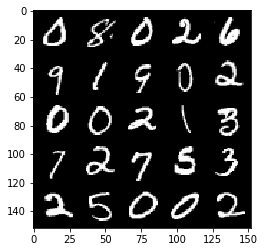

Epoch 138, Step 65000, Gen Loss 1.5421610352993018, Disc Loss 0.4061676457524301


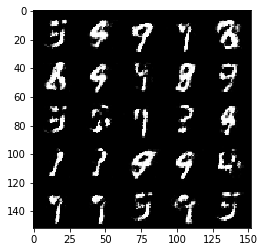

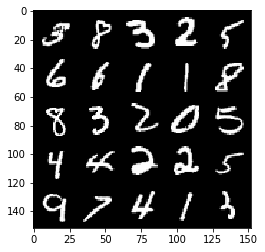

Epoch 139, Step 65500, Gen Loss 1.6138606243133538, Disc Loss 0.3948010610342028


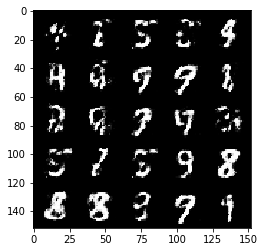

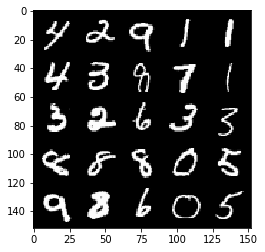

Epoch 140, Step 66000, Gen Loss 1.59459843492508, Disc Loss 0.4094134409427647


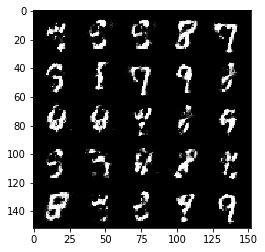

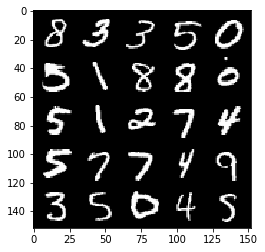

Epoch 141, Step 66500, Gen Loss 1.5702005429267862, Disc Loss 0.4159694089889528


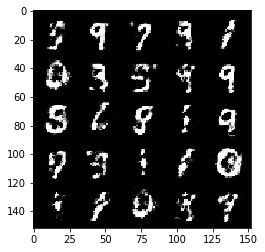

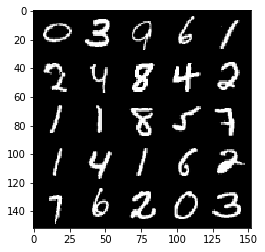

Epoch 142, Step 67000, Gen Loss 1.6079434163570419, Disc Loss 0.40904273855686196


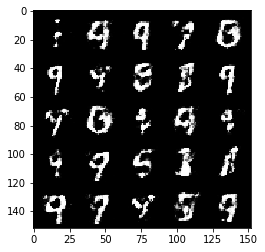

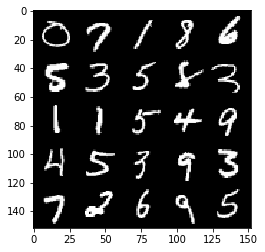

Epoch 143, Step 67500, Gen Loss 1.5392899005413068, Disc Loss 0.42908412301540366


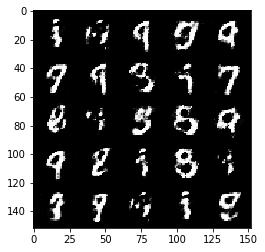

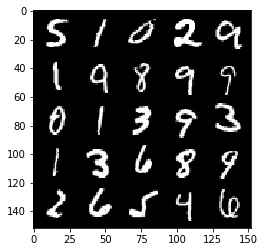

Epoch 144, Step 68000, Gen Loss 1.4883127489089953, Disc Loss 0.42418771404027933


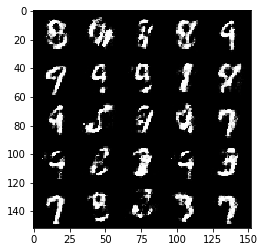

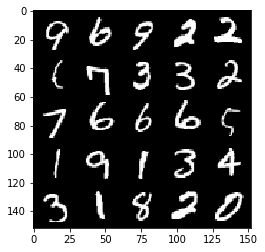

Epoch 146, Step 68500, Gen Loss 1.5618562493324282, Disc Loss 0.4092697711586954


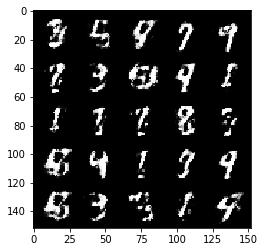

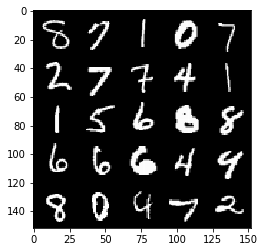

Epoch 147, Step 69000, Gen Loss 1.5922917928695692, Disc Loss 0.4032316746115684


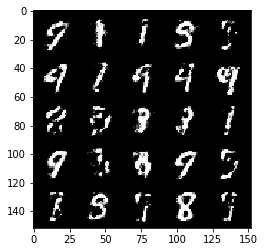

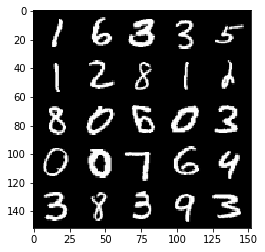

Epoch 148, Step 69500, Gen Loss 1.556549259662629, Disc Loss 0.3983123325109485


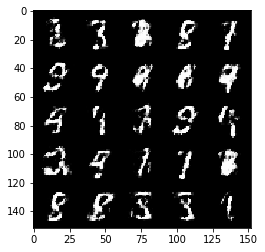

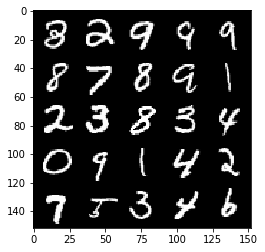

Epoch 149, Step 70000, Gen Loss 1.543484802007674, Disc Loss 0.42312545955181124


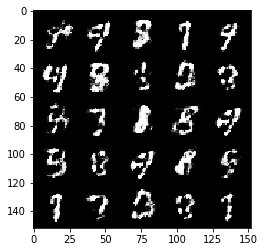

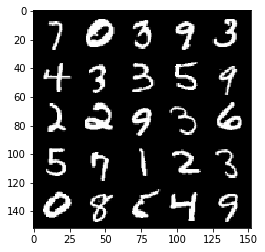

Epoch 150, Step 70500, Gen Loss 1.5011761000156414, Disc Loss 0.43829961472749734


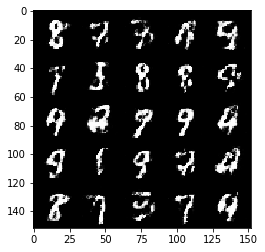

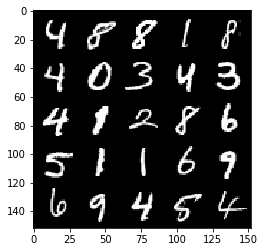

Epoch 151, Step 71000, Gen Loss 1.4461584341526033, Disc Loss 0.4407031523585319


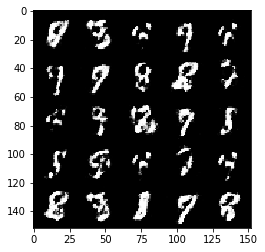

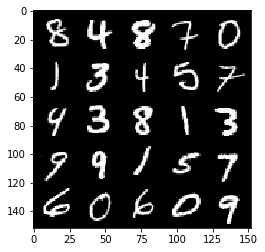

Epoch 152, Step 71500, Gen Loss 1.472169981479643, Disc Loss 0.431614989995956


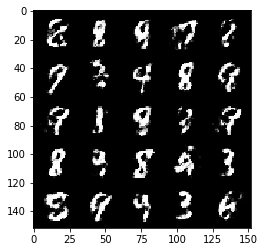

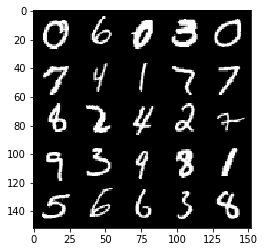

Epoch 153, Step 72000, Gen Loss 1.4910818655490872, Disc Loss 0.42828156900405917


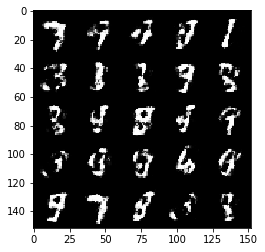

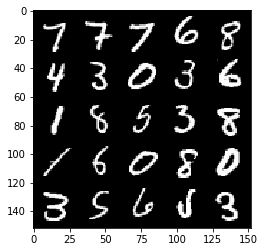

Epoch 154, Step 72500, Gen Loss 1.4905721676349648, Disc Loss 0.4255483816266061


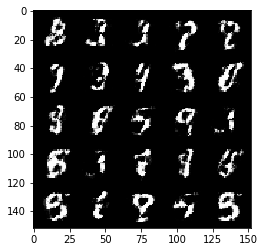

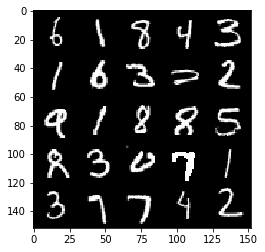

Epoch 155, Step 73000, Gen Loss 1.4985181670188896, Disc Loss 0.43054557603597626


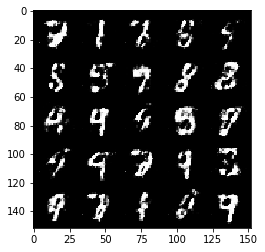

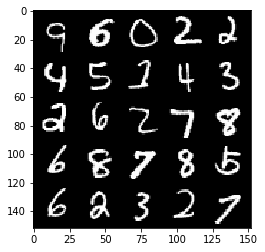

Epoch 156, Step 73500, Gen Loss 1.4131532087326049, Disc Loss 0.433425856649876


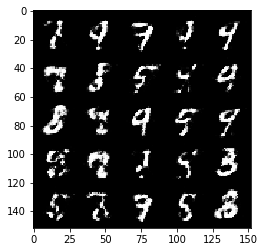

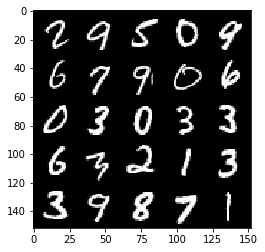

Epoch 157, Step 74000, Gen Loss 1.4329482789039603, Disc Loss 0.4342008731365207


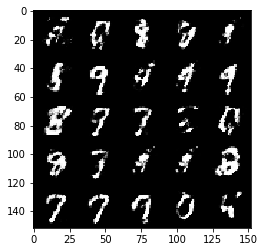

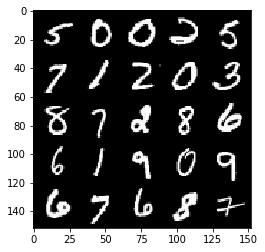

Epoch 158, Step 74500, Gen Loss 1.492147073030472, Disc Loss 0.41617268705368016


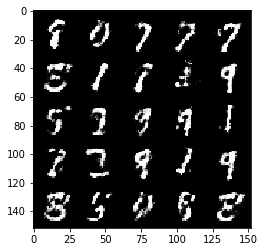

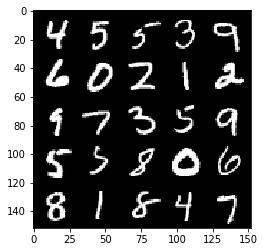

Epoch 159, Step 75000, Gen Loss 1.4612497613430024, Disc Loss 0.44187309193611163


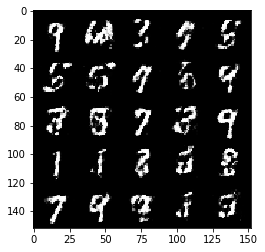

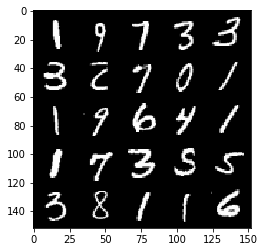

Epoch 160, Step 75500, Gen Loss 1.461675312757491, Disc Loss 0.4360748987793924


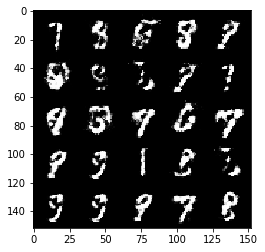

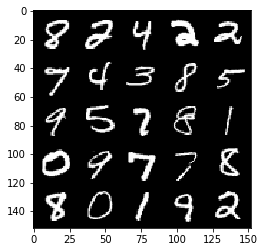

Epoch 162, Step 76000, Gen Loss 1.3743188607692725, Disc Loss 0.4672529218792912


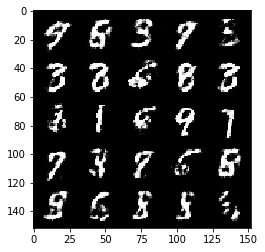

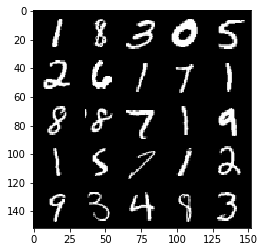

Epoch 163, Step 76500, Gen Loss 1.4191135225296028, Disc Loss 0.43984564316272745


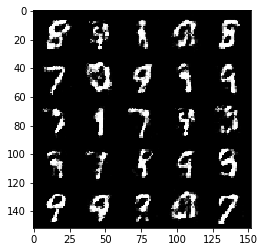

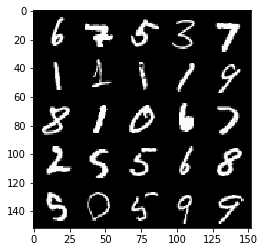

Epoch 164, Step 77000, Gen Loss 1.4480034747123727, Disc Loss 0.4388483531475064


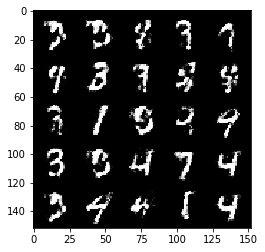

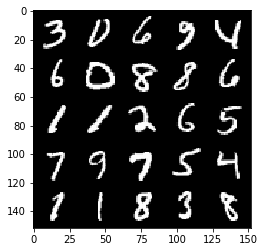

Epoch 165, Step 77500, Gen Loss 1.3424578571319572, Disc Loss 0.4747522230744362


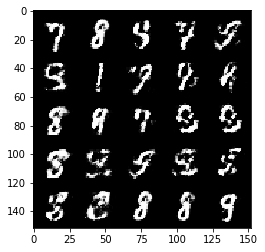

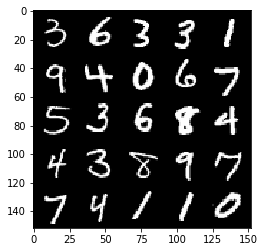

Epoch 166, Step 78000, Gen Loss 1.315754016637801, Disc Loss 0.47173115706443774


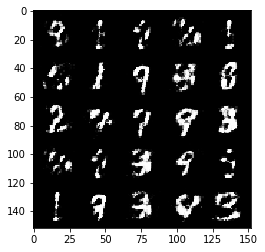

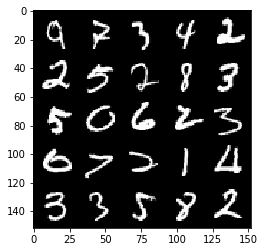

Epoch 167, Step 78500, Gen Loss 1.377191805839539, Disc Loss 0.45091110026836345


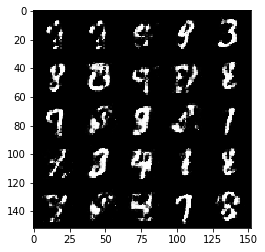

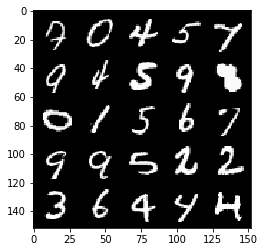

Epoch 168, Step 79000, Gen Loss 1.3658979873657244, Disc Loss 0.45898475927114474


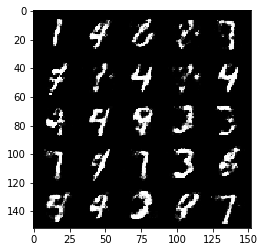

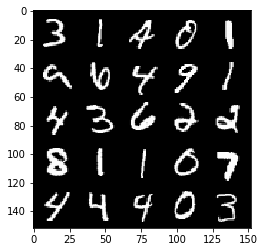

Epoch 169, Step 79500, Gen Loss 1.3617285025119783, Disc Loss 0.45655810374021505


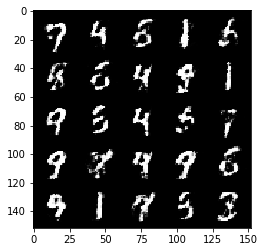

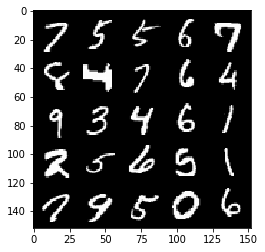

Epoch 170, Step 80000, Gen Loss 1.3180297198295594, Disc Loss 0.4623368695378303


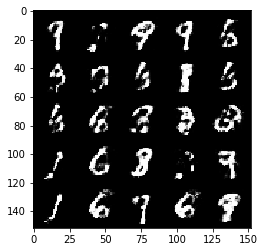

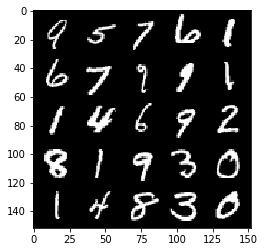

Epoch 171, Step 80500, Gen Loss 1.3507954907417308, Disc Loss 0.45324945461750116


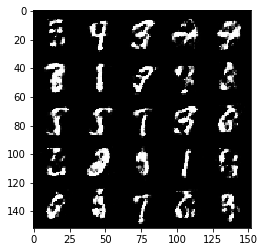

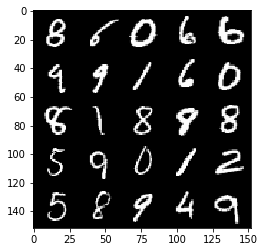

Epoch 172, Step 81000, Gen Loss 1.3551867866516119, Disc Loss 0.4449702122807505


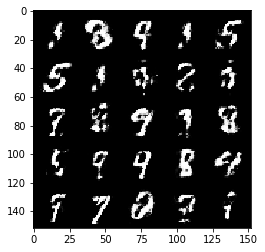

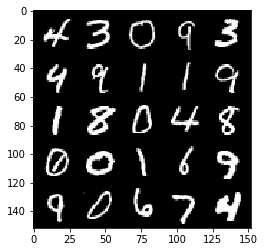

Epoch 173, Step 81500, Gen Loss 1.3749541673660268, Disc Loss 0.44919948369264606


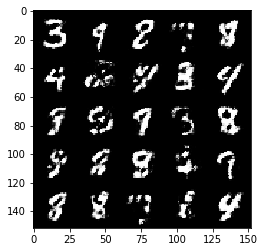

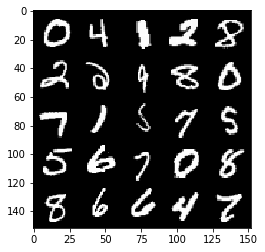

Epoch 174, Step 82000, Gen Loss 1.3041967015266422, Disc Loss 0.47503564769029627


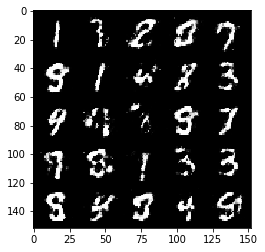

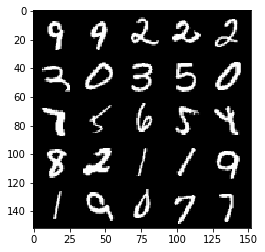

Epoch 175, Step 82500, Gen Loss 1.2772228882312777, Disc Loss 0.4798753412961959


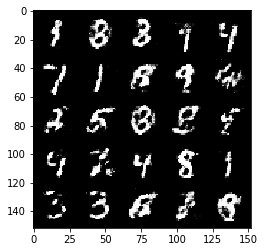

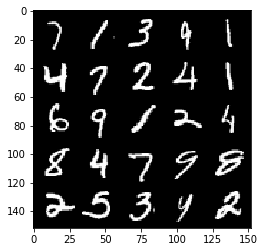

Epoch 176, Step 83000, Gen Loss 1.2797018193006513, Disc Loss 0.5005575360655786


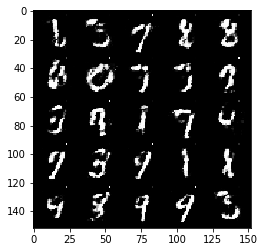

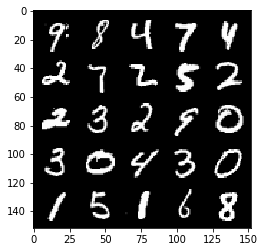

Epoch 178, Step 83500, Gen Loss 1.3099245339632046, Disc Loss 0.46378543090820307


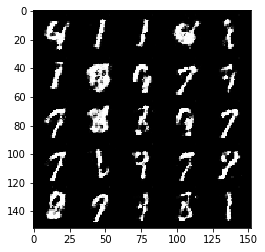

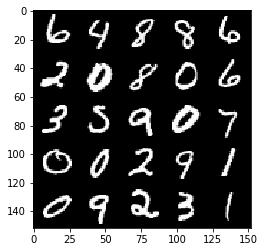

Epoch 179, Step 84000, Gen Loss 1.304864878654479, Disc Loss 0.4762625539898871


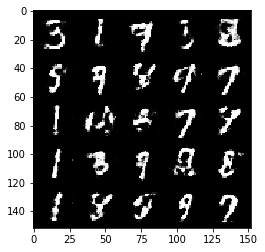

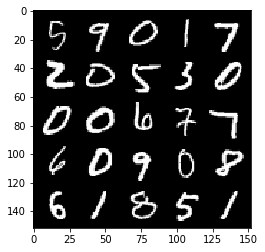

Epoch 180, Step 84500, Gen Loss 1.3039656250476843, Disc Loss 0.46490152609348273


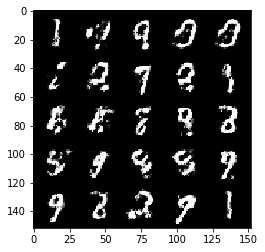

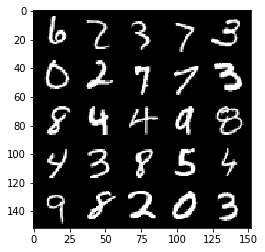

Epoch 181, Step 85000, Gen Loss 1.3334353122711182, Disc Loss 0.45831726253032706


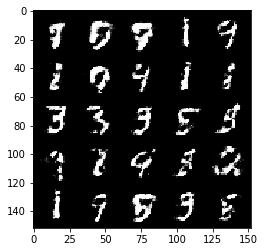

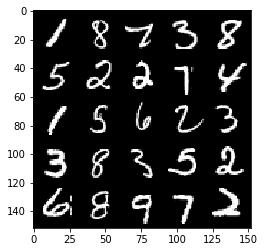

Epoch 182, Step 85500, Gen Loss 1.2811793708801258, Disc Loss 0.4721405637264249


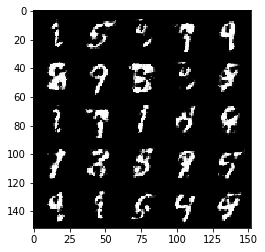

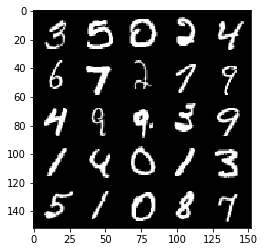

Epoch 183, Step 86000, Gen Loss 1.3258362367153163, Disc Loss 0.467583232820034


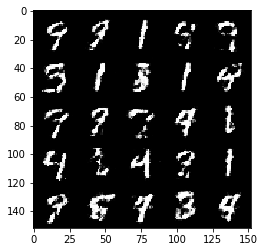

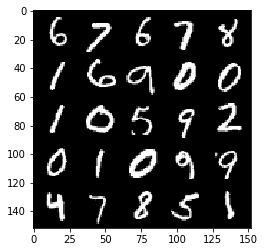

Epoch 184, Step 86500, Gen Loss 1.2885514550209052, Disc Loss 0.4738648725748061


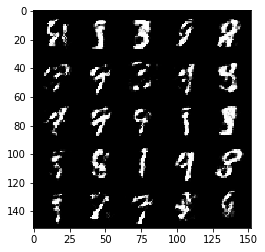

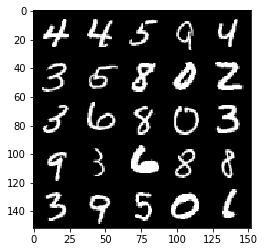

Epoch 185, Step 87000, Gen Loss 1.285303231477738, Disc Loss 0.4689689822793012


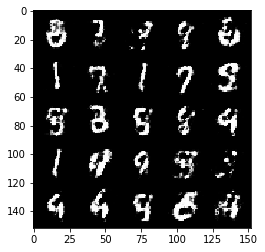

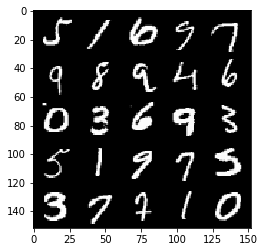

Epoch 186, Step 87500, Gen Loss 1.2649246168136603, Disc Loss 0.48566706848144536


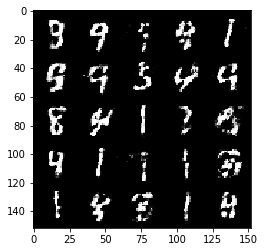

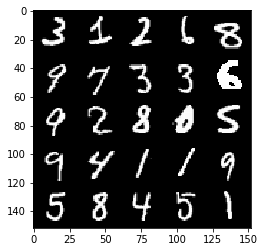

Epoch 187, Step 88000, Gen Loss 1.275879238843918, Disc Loss 0.46496840476989715


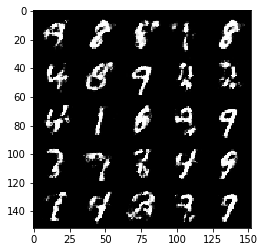

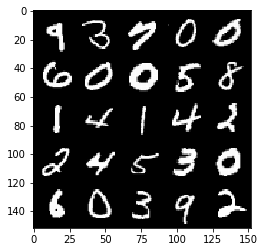

Epoch 188, Step 88500, Gen Loss 1.3505103740692126, Disc Loss 0.44556219857931123


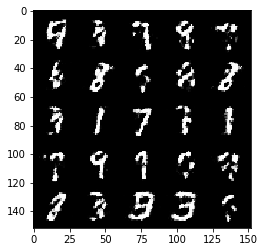

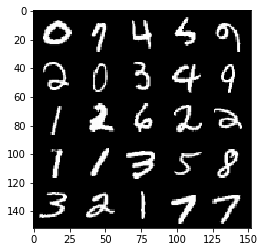

Epoch 189, Step 89000, Gen Loss 1.3321774895191185, Disc Loss 0.4693903787732125


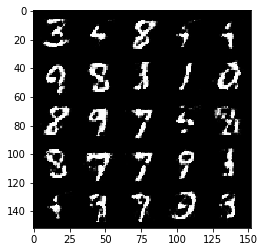

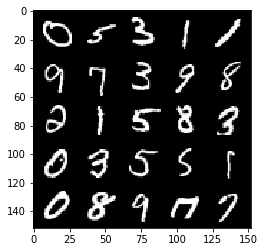

Epoch 190, Step 89500, Gen Loss 1.240542063713074, Disc Loss 0.4934390549659733


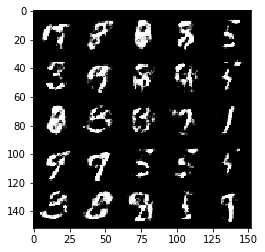

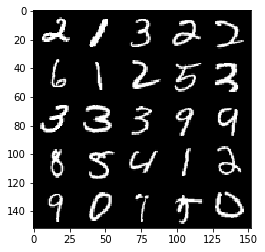

Epoch 191, Step 90000, Gen Loss 1.177078255176545, Disc Loss 0.5191321265697475


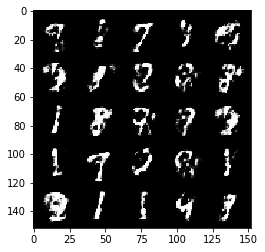

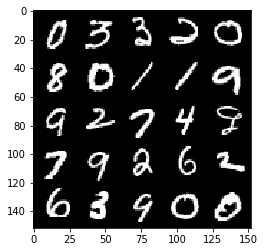

Epoch 192, Step 90500, Gen Loss 1.22381314253807, Disc Loss 0.4845667022466658


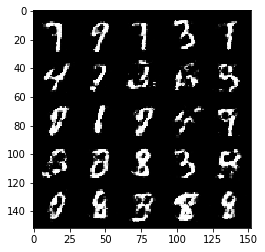

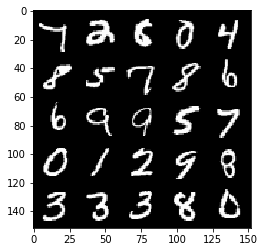

Epoch 194, Step 91000, Gen Loss 1.2773952678442004, Disc Loss 0.48152851158380494


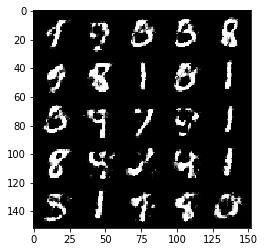

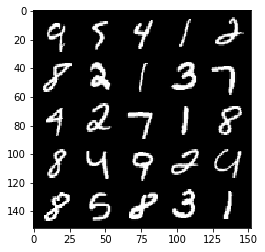

Epoch 195, Step 91500, Gen Loss 1.1622687420845035, Disc Loss 0.5196352171301838


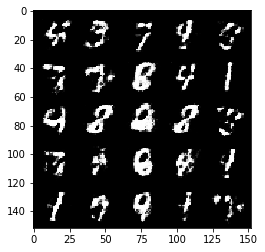

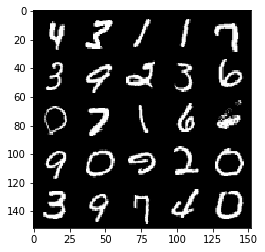

Epoch 196, Step 92000, Gen Loss 1.1860433057546618, Disc Loss 0.4973559257984161


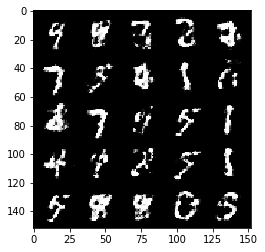

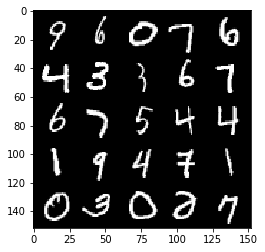

Epoch 197, Step 92500, Gen Loss 1.1958641095161457, Disc Loss 0.4951328653693196


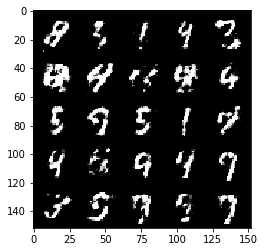

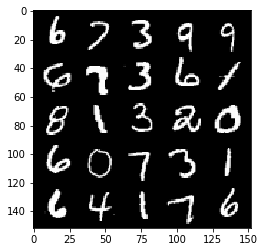

Epoch 198, Step 93000, Gen Loss 1.2683761203289028, Disc Loss 0.4738196945190431


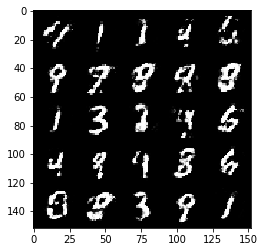

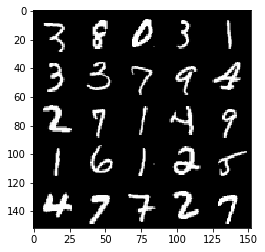

Epoch 199, Step 93500, Gen Loss 1.274210486650466, Disc Loss 0.4764043526649477


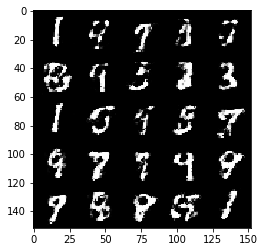

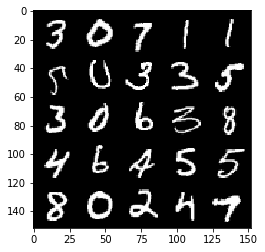

In [21]:
for epoch in range(n_epochs):
    
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).cuda()
        
        disc_opt.zero_grad()
        fake_images = gen(torch.randn(cur_batch_size, z_dim).cuda()).detach()
        pred = disc(fake_images)
        y_fake = torch.zeros_like(pred)
        loss_fake = criterion(pred, y_fake)
        pred = disc(real)
        y_real = torch.ones_like(pred)
        loss_real = criterion(pred, y_real)
        disc_loss = (loss_fake + loss_real) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        
        gen_opt.zero_grad()
        fake_images = gen(torch.randn(cur_batch_size, z_dim).cuda())
        pred = disc(fake_images)
        y = torch.ones_like(pred)
        gen_loss = criterion(pred, y)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        
        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step
        
        if cur_step % display_step == 0 and cur_step > 0:
            print(f'Epoch {epoch}, Step {cur_step}, Gen Loss {mean_generator_loss}, Disc Loss {mean_discriminator_loss}')
            fake = gen(torch.randn(cur_batch_size, z_dim).cuda())
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_discriminator_loss = 0
            mean_generator_loss = 0
        cur_step += 1